# Phase 1: Exploratory Data Analysis (EDA)
## Flood Impact Assessment - Multi-Temporal Satellite Segmentation

This notebook performs comprehensive exploratory data analysis on satellite imagery datasets (Germany and Louisiana) to understand:
- Dataset structure and file organization
- Image properties (shape, channels, data types)
- Class distribution and imbalance severity
- Data quality and alignment issues
- Temporal changes between pre and post-event images
- Geospatial distribution of flood impacts

**Datasets Analyzed:**
- Germany Training Public (pre/post event RGB images + GeoJSON annotations)
- Louisiana-East Training Public (same structure)
- Louisiana-West Test Public (for evaluation)

In [329]:
import sys

IS_COLAB = 'google.colab' in sys.modules
print(f"Running in Google Colab: {IS_COLAB}")

Running in Google Colab: True


In [330]:
import platform
import psutil
import subprocess
import os

if IS_COLAB:
    print("Google Colab Environment Specifications:")
    print("="*50)
    
    # Get system info
    
    print(f"Operating System: {platform.system()} {platform.release()}")
    print(f"Architecture: {platform.machine()}")
    print(f"Python Version: {platform.python_version()}")
    
    # Memory info
    memory = psutil.virtual_memory()
    print(f"Total RAM: {memory.total / (1024**3):.1f} GB")
    print(f"Available RAM: {memory.available / (1024**3):.1f} GB")
    
    # CPU info
    print(f"CPU Cores: {psutil.cpu_count(logical=False)} physical, {psutil.cpu_count(logical=True)} logical")
    
    # GPU info
    try:
        result = subprocess.run(['nvidia-smi', '--query-gpu=name,memory.total', '--format=csv,noheader,nounits'], 
                              capture_output=True, text=True)
        if result.returncode == 0:
            gpu_info = result.stdout.strip().split('\n')
            for i, gpu in enumerate(gpu_info):
                name, memory = gpu.split(', ')
                print(f"GPU {i}: {name}, {memory} MB VRAM")
        else:
            print("GPU: Not detected or nvidia-smi unavailable")
    except:
        print("GPU: Not detected")
    
    # Disk space
    disk = psutil.disk_usage('/')
    print(f"Disk Space: {disk.free / (1024**3):.1f} GB free / {disk.total / (1024**3):.1f} GB total")
    
    print("="*50)

    if not os.path.exists('/content/aai521_3proj'):
        print("WARNING: Cloning project repository required.")
        print("="*50)
else:
    print("Not running in Google Colab environment")

Google Colab Environment Specifications:
Operating System: Linux 6.6.105+
Architecture: x86_64
Python Version: 3.12.12
Total RAM: 83.5 GB
Available RAM: 76.3 GB
CPU Cores: 6 physical, 12 logical
GPU 0: NVIDIA A100-SXM4-40GB, 40960 MB VRAM
Disk Space: 99.9 GB free / 235.7 GB total


In [350]:
import os
import sys

if IS_COLAB:
    print("Running in Google Colab environment.")
    if os.path.exists('/content/aai521_3proj'):
        print("Repository already exists. Pulling latest changes...")
        %cd /content/aai521_3proj
        !git pull
    else:
        print("Cloning repository...")
        !git clone https://github.com/swapnilprakashpatil/aai521_3proj.git
        %cd aai521_3proj    
    %pip install -r requirements.txt --quiet
    sys.path.append('/content/aai521_3proj/src')
    %ls
else:
    print("Running in local environment. Installing packages...")
    %pip install -r ../requirements.txt --quiet
    sys.path.append('../src')

Running in Google Colab environment.
Repository already exists. Pulling latest changes...
/content/aai521_3proj
Already up to date.
Already up to date.
dataset/  notebooks/  requirements.txt  src/
dataset/  notebooks/  requirements.txt  src/


## 1. Setup & Environment

In [332]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import json
import warnings
from collections import Counter
from typing import Dict, List, Tuple
import cv2
from scipy import ndimage
warnings.filterwarnings('ignore')

# Optional libraries
HAS_RASTERIO = False
try:
    import rasterio
    from rasterio.plot import show
    HAS_RASTERIO = True
except ImportError:
    pass

HAS_GEOSPATIAL = False
try:
    import geopandas as gpd
    import folium
    HAS_GEOSPATIAL = True
except ImportError:
    pass

HAS_PLOTLY = False
try:
    import plotly.express as px
    import plotly.graph_objects as go
    HAS_PLOTLY = True
except ImportError:
    pass

# Reload modules to pick up latest changes
import importlib
if 'config' in sys.modules:
    importlib.reload(sys.modules['config'])
if 'visualizations' in sys.modules:
    importlib.reload(sys.modules['visualizations'])
if 'eda_utils' in sys.modules:
    importlib.reload(sys.modules['eda_utils'])

# Import project config
from config import (
    BASE_PATH, 
    WORKSPACE_PATH,
    SAMPLE_OUTPUTS_DIR,
    RESULTS_DIR,
    CLASS_NAMES,
    CLASS_COLORS,
    FLOOD_CLASS_NAMES
)

# Import visualization functions
from visualizations import (
    plot_csv_metadata_analysis,
    plot_pixel_distributions,
    plot_temporal_change_detection,
    plot_edge_detection_analysis,
    plot_geospatial_distribution,
    plot_annotation_samples_grid
)

# Import EDA utility functions
from eda_utils import (
    format_size,
    load_geojson_annotations,
    validate_csv_file_integrity,
    analyze_image_properties,
    compute_csv_summary_statistics,
    calculate_class_imbalance_metrics,
    extract_geospatial_coordinates
)

# Plotting configuration
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("Environment setup complete")

Environment setup complete


## 2. Load Dataset and Inspect Structure

In [333]:
# Define dataset paths for all three regions
germany_path = BASE_PATH / "train" / "Germany_Training_Public"
louisiana_east_path = BASE_PATH / "train" / "Louisiana-East_Training_Public"
louisiana_west_test_path = BASE_PATH / "test" / "Louisiana-West_Test_Public"

# Create dictionary of datasets
datasets = {
    "Germany": germany_path,
    "Louisiana-East": louisiana_east_path,
    "Louisiana-West (Test)": louisiana_west_test_path,
}

print("Analyzing dataset structure...")

dataset_info = {}

for name, path in datasets.items():
    exists = path.exists()
    status = "[OK]" if exists else "[MISSING]"
    
    if exists:
        # Count files in different directories
        pre_dir = path / "PRE-event"
        post_dir = path / "POST-event"
        ann_dir = path / "annotations"
        
        pre_tif = list(pre_dir.glob("*.tif")) if pre_dir.exists() else []
        pre_png = list(pre_dir.glob("*.png")) if pre_dir.exists() else []
        pre_files = pre_tif + pre_png
        
        post_tif = list(post_dir.glob("*.tif")) if post_dir.exists() else []
        post_png = list(post_dir.glob("*.png")) if post_dir.exists() else []
        post_files = post_tif + post_png
        
        ann_files = list(ann_dir.glob("*.geojson")) if ann_dir.exists() else []
        csv_files = list(path.glob("*.csv"))
        
        # Calculate total storage size
        total_size = sum(f.stat().st_size for f in pre_files + post_files + ann_files)
        
        dataset_info[name] = {
            "path": str(path),
            "exists": exists,
            "pre_images": len(pre_files),
            "post_images": len(post_files),
            "annotations": len(ann_files),
            "csv_mappings": len(csv_files),
            "total_size_bytes": total_size,
            "total_size_formatted": format_size(total_size),
            "pre_tif_count": len(pre_tif),
            "pre_png_count": len(pre_png),
            "post_tif_count": len(post_tif),
            "post_png_count": len(post_png)
        }
        
        print(f"{status} {name}: {len(pre_files)} PRE + {len(post_files)} POST images, "
              f"{len(ann_files)} annotations ({format_size(total_size)})")

total_datasets = sum(1 for v in dataset_info.values() if v['exists'])
total_images = sum(v['pre_images'] + v['post_images'] for v in dataset_info.values())
total_annotations = sum(v['annotations'] for v in dataset_info.values())

print(f"\nSummary: {total_datasets} datasets, {total_images} images, {total_annotations} annotations")

Analyzing dataset structure...
[OK] Germany: 202 PRE + 282 POST images, 202 annotations (1.70 GB)
[OK] Louisiana-East: 599 PRE + 599 POST images, 599 annotations (3.92 GB)
[OK] Louisiana-West (Test): 406 PRE + 488 POST images, 0 annotations (3.00 GB)

Summary: 3 datasets, 2576 images, 801 annotations


## 3. CSV Metadata Analysis

Analysis of CSV files that map labels to images and provide reference data:
- **label_image_mapping.csv**: Maps GeoJSON annotations to pre/post-event images
- **reference.csv**: Contains road network metadata with flood status and geometry

In [334]:
print("Loading CSV metadata files...")

csv_analysis = {}

for dataset_name, dataset_path in [
    ("Germany", germany_path), 
    ("Louisiana-East", louisiana_east_path),
    ("Louisiana-West (Test)", louisiana_west_test_path)
]:
    if dataset_path.exists():
        csv_files = list(dataset_path.glob("*.csv"))
        csv_analysis[dataset_name] = {}
        
        for csv_file in csv_files:
            csv_type = "mapping" if "mapping" in csv_file.name else "reference"
            
            try:
                try:
                    df = pd.read_csv(csv_file)
                except pd.errors.ParserError:
                    df = pd.read_csv(csv_file, on_bad_lines='skip')
                except ValueError as ve:
                    if "convert" in str(ve).lower():
                        df = pd.read_csv(csv_file, dtype=str)
                    else:
                        raise
                
                csv_analysis[dataset_name][csv_type] = {
                    "filename": csv_file.name,
                    "rows": len(df),
                    "columns": list(df.columns),
                    "size_bytes": csv_file.stat().st_size,
                    "dataframe": df
                }
                
                print(f"  {dataset_name}/{csv_file.name}: {len(df)} rows, {len(df.columns)} columns")
                
            except Exception as e:
                print(f"  Error reading {csv_file.name}: {e}")

print(f"CSV metadata loaded from {len(csv_analysis)} datasets")

Loading CSV metadata files...
  Germany/Germany_Training_Public_label_image_mapping.csv: 202 rows, 4 columns
  Germany/Germany_Training_Public_reference.csv: 9761 rows, 6 columns
  Germany/Germany_Training_Public_reference.csv: 9761 rows, 6 columns
  Louisiana-East/Louisiana-East_Training_Public_reference.csv: 23663 rows, 6 columns
  Louisiana-East/Louisiana-East_Training_Public_label_image_mapping.csv: 599 rows, 4 columns
  Louisiana-West (Test)/Louisiana-West_Test_Public_label_image_mapping.csv: 406 rows, 4 columns
CSV metadata loaded from 3 datasets
  Louisiana-East/Louisiana-East_Training_Public_reference.csv: 23663 rows, 6 columns
  Louisiana-East/Louisiana-East_Training_Public_label_image_mapping.csv: 599 rows, 4 columns
  Louisiana-West (Test)/Louisiana-West_Test_Public_label_image_mapping.csv: 406 rows, 4 columns
CSV metadata loaded from 3 datasets


### CSV Data Visualizations

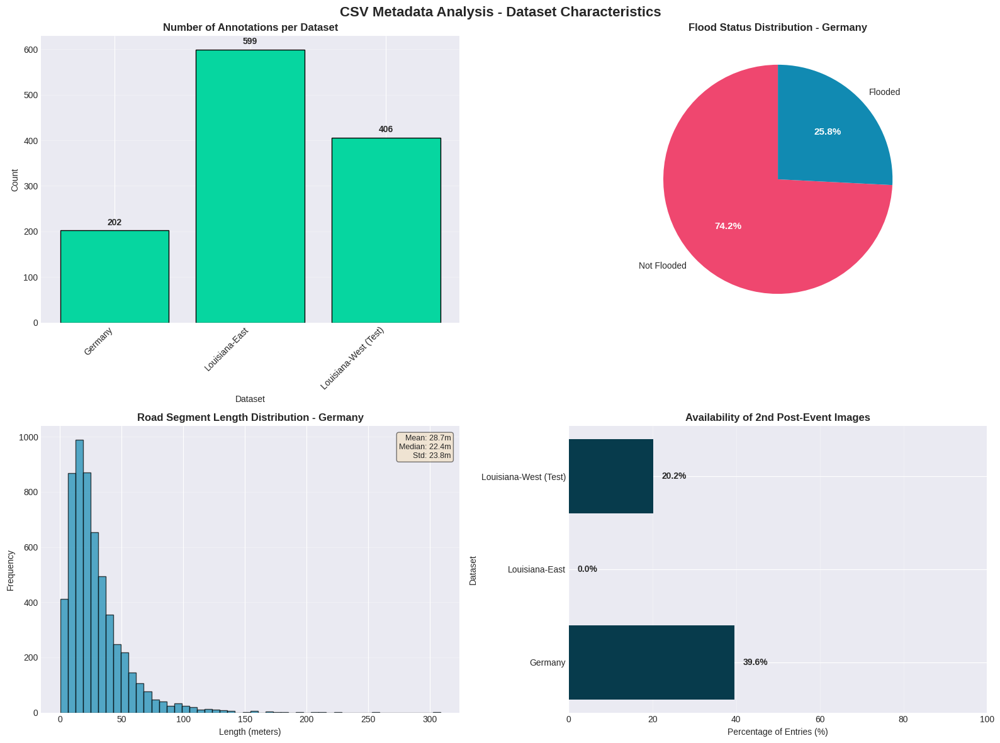

In [335]:
# Reload visualizations module to pick up latest changes
if 'visualizations' in sys.modules:
    importlib.reload(sys.modules['visualizations'])
from visualizations import plot_csv_metadata_analysis

# Visualize CSV metadata analysis
fig = plot_csv_metadata_analysis(csv_analysis)
plt.show()

### CSV-to-File Integrity Validation

Verify that all images and annotations referenced in CSV files actually exist on disk.

In [336]:
print("Validating CSV-to-file integrity...")

integrity_results = {}

for dataset_name, dataset_path in [
    ("Germany", germany_path), 
    ("Louisiana-East", louisiana_east_path),
    ("Louisiana-West (Test)", louisiana_west_test_path)
]:
    if dataset_path.exists():
        print(f"\n  Validating {dataset_name}...")
        result = validate_csv_file_integrity(dataset_name, dataset_path, verbose=True)
        if "error" not in result:
            integrity_results[dataset_name] = result

# Create summary dataframe
if integrity_results:
    integrity_df = pd.DataFrame(integrity_results).T
    print("\nIntegrity Summary:")
    print(integrity_df[['total_entries', 'label_match_rate', 'pre_match_rate', 'post1_match_rate']])

print(f"\nIntegrity validation complete for {len(integrity_results)} datasets")

Validating CSV-to-file integrity...

  Validating Germany...

  Integrity Check Results:
    Label files:            202/202 (100.0%)
    Pre-event images:       202/202 (100.0%)
    Post-event images (1):  202/202 (100.0%)

  Validating Louisiana-East...

  Integrity Check Results:
    Label files:            599/599 (100.0%)
    Pre-event images:       599/599 (100.0%)
    Post-event images (1):  599/599 (100.0%)

  Validating Louisiana-West (Test)...

  Integrity Check Results:
    Label files:              0/406 (  0.0%)
    Pre-event images:       406/406 (100.0%)
    Post-event images (1):  406/406 (100.0%)

Integrity Summary:
                      total_entries label_match_rate pre_match_rate  \
Germany                         202            100.0          100.0   
Louisiana-East                  599            100.0          100.0   
Louisiana-West (Test)           406              0.0          100.0   

                      post1_match_rate  
Germany                          

### CSV Summary Statistics & Insights

In [337]:
print("Computing CSV summary statistics...")

# Compile comprehensive statistics using utility function
csv_summary = compute_csv_summary_statistics(csv_analysis)

print(f"\nCross-Dataset Summary:")
print(f"  Total datasets with CSV metadata: {csv_summary['total_datasets']}")
print(f"  Total label-image mappings: {csv_summary['total_mappings']:,}")
print(f"  Total road segments: {csv_summary['total_road_segments']:,}")
print(f"  Datasets with dual post-event images: {csv_summary['datasets_with_dual_post_images']}")

if csv_summary['flood_statistics']:
    print(f"\nFlood Impact Statistics:")
    total_flood_records = sum(csv_summary['flood_statistics'].values())
    for status, count in sorted(csv_summary['flood_statistics'].items(), key=lambda x: x[1], reverse=True):
        pct = (count / total_flood_records) * 100
        print(f"  {status:12s}: {count:6,} ({pct:5.1f}%)")

if 'all_lengths' in csv_summary['road_length_statistics']:
    all_lengths = np.array(csv_summary['road_length_statistics']['all_lengths'])
    print(f"\nRoad Segment Length Statistics:")
    print(f"  Total segments: {len(all_lengths):,}")
    print(f"  Mean length: {all_lengths.mean():.2f} meters")
    print(f"  Total network length: {all_lengths.sum()/1000:.2f} km")

# Generate insights
insights = []
insights.append(f"Dataset provides {csv_summary['total_mappings']:,} label-to-image mappings across {csv_summary['total_datasets']} regions")
if csv_summary['datasets_with_dual_post_images'] > 0:
    insights.append(f"{csv_summary['datasets_with_dual_post_images']} dataset(s) have multiple post-event images for temporal analysis")
if integrity_results:
    avg_integrity = np.mean([r['label_match_rate'] for r in integrity_results.values()])
    insights.append(f"Data integrity: {avg_integrity:.1f}% average match rate between CSV and files")

print("\nKEY INSIGHTS:")
for i, insight in enumerate(insights, 1):
    print(f"{i}. {insight}")

Computing CSV summary statistics...

Cross-Dataset Summary:
  Total datasets with CSV metadata: 3
  Total label-image mappings: 1,207
  Total road segments: 33,424
  Datasets with dual post-event images: 2

Flood Impact Statistics:
  False       : 26,077 ( 78.0%)
  True        :  7,075 ( 21.2%)
  Null        :    272 (  0.8%)

Road Segment Length Statistics:
  Total segments: 16,512
  Mean length: 46.54 meters
  Total network length: 768.43 km

KEY INSIGHTS:
1. Dataset provides 1,207 label-to-image mappings across 3 regions
2. 2 dataset(s) have multiple post-event images for temporal analysis
3. Data integrity: 66.7% average match rate between CSV and files


## 4. Image & Mask Property Analysis

In [338]:
print("Analyzing image properties...")

image_analysis = {}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    if dataset_path.exists():
        print(f"  Analyzing {dataset_name}...")
        analysis = analyze_image_properties(dataset_name, dataset_path, sample_size=10)
        
        if "error" not in analysis:
            image_analysis[dataset_name] = analysis
            
            # Print summary
            shape = analysis['most_common_shape']
            print(f"    Shape: {shape}, Dtype: {list(analysis['dtypes'].keys())[0]}, "
                  f"Files: {analysis['total_images']}, Avg size: {format_size(analysis['avg_file_size'])}")

# Create summary DataFrame
summary_data = []
for dataset_name, analysis in image_analysis.items():
    summary_data.append({
        "Dataset": dataset_name,
        "Total Images": analysis['total_images'],
        "Shape": str(analysis['most_common_shape']),
        "Channels": analysis['num_channels'],
        "Dtype": list(analysis['dtypes'].keys())[0],
        "Value Range": f"{analysis['value_ranges']['min']:.0f}-{analysis['value_ranges']['max']:.0f}",
        "Mean": f"{analysis['value_ranges']['mean_avg']:.2f}",
        "Avg File Size": format_size(analysis['avg_file_size'])
    })

summary_df = pd.DataFrame(summary_data)
print("\nImage Analysis Summary:")
print(summary_df.to_string(index=False))
print(f"\nImage property analysis complete for {len(image_analysis)} datasets")

Analyzing image properties...
  Analyzing Germany...
    Shape: (1300, 1300, 3), Dtype: uint8, Files: 202, Avg size: 3.20 MB
  Analyzing Louisiana-East...
    Shape: (1300, 1300, 3), Dtype: uint8, Files: 202, Avg size: 3.20 MB
  Analyzing Louisiana-East...
    Shape: (1300, 1300, 3), Dtype: uint8, Files: 599, Avg size: 4.49 MB

Image Analysis Summary:
       Dataset  Total Images           Shape  Channels Dtype Value Range  Mean Avg File Size
       Germany           202 (1300, 1300, 3)         3 uint8       0-255 59.53       3.20 MB
Louisiana-East           599 (1300, 1300, 3)         3 uint8       0-255 61.98       4.49 MB

Image property analysis complete for 2 datasets
    Shape: (1300, 1300, 3), Dtype: uint8, Files: 599, Avg size: 4.49 MB

Image Analysis Summary:
       Dataset  Total Images           Shape  Channels Dtype Value Range  Mean Avg File Size
       Germany           202 (1300, 1300, 3)         3 uint8       0-255 59.53       3.20 MB
Louisiana-East           599 (1300,

## 5. Class Distribution Analysis

Analyzing class distributions from GeoJSON annotations...
  Germany...
    Loaded 4952 features from 202 files
    Column 'type': 0 unique values
    Column 'geometry_type': 4 unique values
  Louisiana-East...
    Loaded 15367 features from 599 files
    Column 'type': 1 unique values
    Column 'geometry_type': 4 unique values

Class distribution analysis complete for 2 datasets

Calculating class imbalance metrics...
  Germany_geometry_type: HIGH imbalance (ratio 283.71:1)
    → Consider class weighting or resampling
  Louisiana-East_type: LOW imbalance (ratio 1.00:1)
    → Relatively balanced
  Louisiana-East_geometry_type: HIGH imbalance (ratio 252.08:1)
    → Consider class weighting or resampling
    Loaded 15367 features from 599 files
    Column 'type': 1 unique values
    Column 'geometry_type': 4 unique values

Class distribution analysis complete for 2 datasets

Calculating class imbalance metrics...
  Germany_geometry_type: HIGH imbalance (ratio 283.71:1)
    → Consider cla

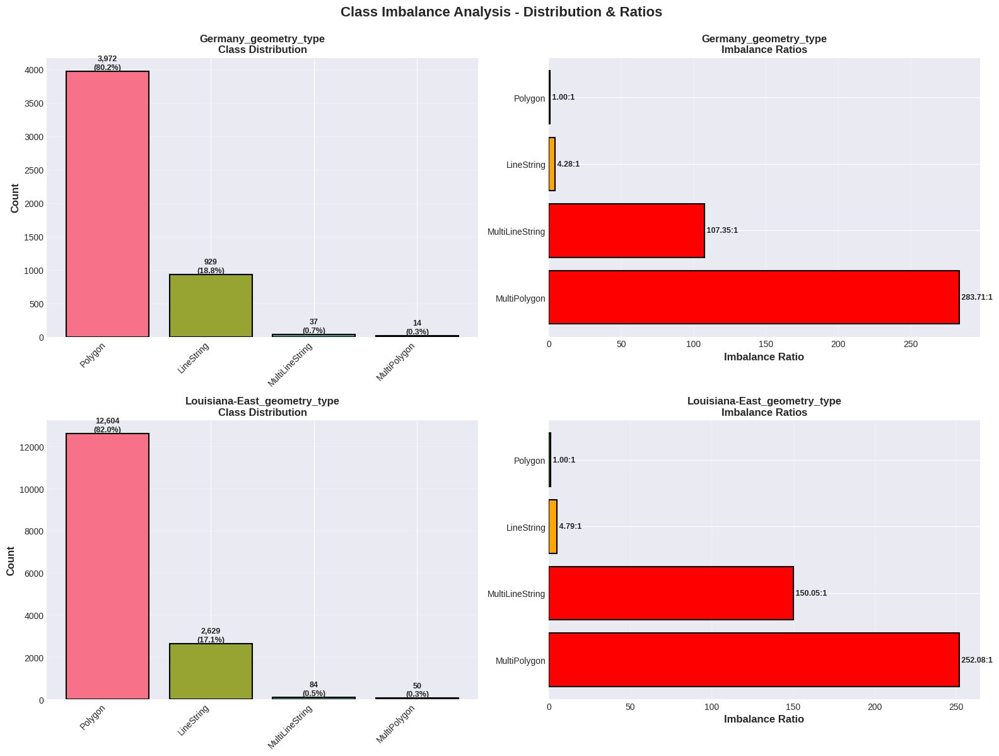

In [339]:
print("Analyzing class distributions from GeoJSON annotations...")

# Load annotations from Germany and Louisiana-East
annotation_data = {}
class_distributions = {}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    ann_path = dataset_path / "annotations"
    if ann_path.exists():
        print(f"  {dataset_name}...")
        
        df = load_geojson_annotations(ann_path)
        annotation_data[dataset_name] = df
        
        print(f"    Loaded {len(df)} features from {len(list(ann_path.glob('*.geojson')))} files")
        
        if len(df) > 0:
            # Analyze different class-related columns
            for col in df.columns:
                if 'class' in col.lower() or 'damage' in col.lower() or 'type' in col.lower():
                    value_counts = df[col].value_counts()
                    class_distributions[f"{dataset_name}_{col}"] = value_counts.to_dict()
                    
                    print(f"    Column '{col}': {len(value_counts)} unique values")

print(f"\nClass distribution analysis complete for {len(annotation_data)} datasets")

# Calculate class imbalance metrics using utility function
print("\nCalculating class imbalance metrics...")
imbalance_metrics = calculate_class_imbalance_metrics(class_distributions)

for key, metrics in imbalance_metrics.items():
    print(f"  {key}: {metrics['severity']} imbalance (ratio {metrics['ratio']:.2f}:1)")
    print(f"    → {metrics['recommendation']}")

# Visualize class imbalance
if class_distributions:
    valid_distributions = {k: v for k, v in class_distributions.items() if v and len(v) > 1}
    
    if valid_distributions:
        num_distributions = len(valid_distributions)
        fig, axes = plt.subplots(num_distributions, 2, figsize=(16, 6 * num_distributions))
        
        if num_distributions == 1:
            axes = axes.reshape(1, -1)
        
        fig.suptitle('Class Imbalance Analysis - Distribution & Ratios', fontsize=16, fontweight='bold', y=0.995)
        
        for idx, (key, distribution) in enumerate(valid_distributions.items()):
            sorted_items = sorted(distribution.items(), key=lambda x: x[1], reverse=True)
            labels = [str(item[0]) for item in sorted_items]
            counts = [item[1] for item in sorted_items]
            
            # Left plot: Bar chart
            colors = sns.color_palette("husl", len(labels))
            axes[idx, 0].bar(range(len(labels)), counts, color=colors, edgecolor='black', linewidth=1.5)
            axes[idx, 0].set_xticks(range(len(labels)))
            axes[idx, 0].set_xticklabels(labels, rotation=45, ha='right')
            axes[idx, 0].set_ylabel('Count', fontweight='bold', fontsize=12)
            axes[idx, 0].set_title(f'{key}\nClass Distribution', fontweight='bold', fontsize=12)
            axes[idx, 0].grid(axis='y', alpha=0.3)
            
            for i, (label, count) in enumerate(zip(labels, counts)):
                pct = 100 * count / sum(counts)
                axes[idx, 0].text(i, count, f'{count:,}\n({pct:.1f}%)', 
                                 ha='center', va='bottom', fontweight='bold', fontsize=9)
            
            # Right plot: Imbalance ratios
            if len(counts) > 0:
                max_count = max(counts)
                ratios = [max_count / count if count > 0 else 0 for count in counts]
                colors_ratio = ['darkgreen' if r < 2 else 'orange' if r < 5 else 'red' for r in ratios]
                
                axes[idx, 1].barh(range(len(labels)), ratios, color=colors_ratio, edgecolor='black', linewidth=1.5)
                axes[idx, 1].set_yticks(range(len(labels)))
                axes[idx, 1].set_yticklabels(labels)
                axes[idx, 1].set_xlabel('Imbalance Ratio', fontweight='bold', fontsize=12)
                axes[idx, 1].set_title(f'{key}\nImbalance Ratios', fontweight='bold', fontsize=12)
                axes[idx, 1].grid(axis='x', alpha=0.3)
                axes[idx, 1].invert_yaxis()
                
                for i, ratio in enumerate(ratios):
                    axes[idx, 1].text(ratio, i, f' {ratio:.2f}:1', 
                                     ha='left', va='center', fontweight='bold', fontsize=9)
        
        plt.tight_layout()
        plt.show()

## 6. Pixel-Level Statistics

Analyzing pixel-level statistics...


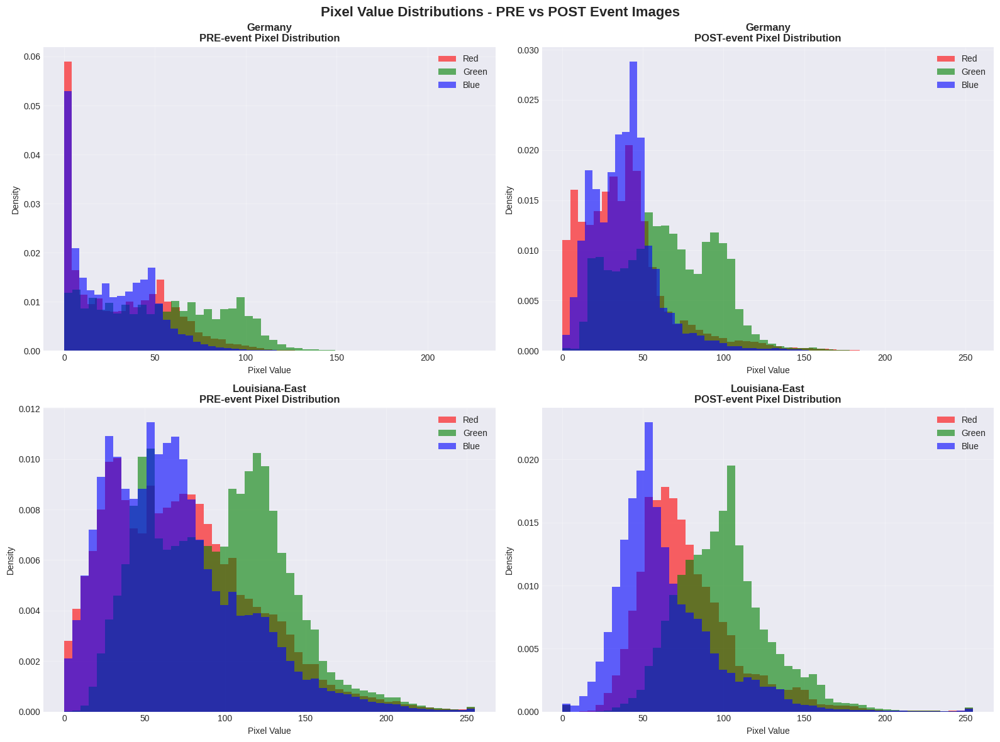

Pixel statistics computed for 2 datasets


In [340]:
print("Analyzing pixel-level statistics...")

dataset_list = [
    ("Germany", germany_path),
    ("Louisiana-East", louisiana_east_path)
]

# Visualize pixel distributions
fig, pixel_statistics = plot_pixel_distributions(dataset_list, num_distributions=2)
plt.show()

print(f"Pixel statistics computed for {len(pixel_statistics)} datasets")

## 7. Temporal Change Detection & Difference Analysis

Computing temporal change detection...


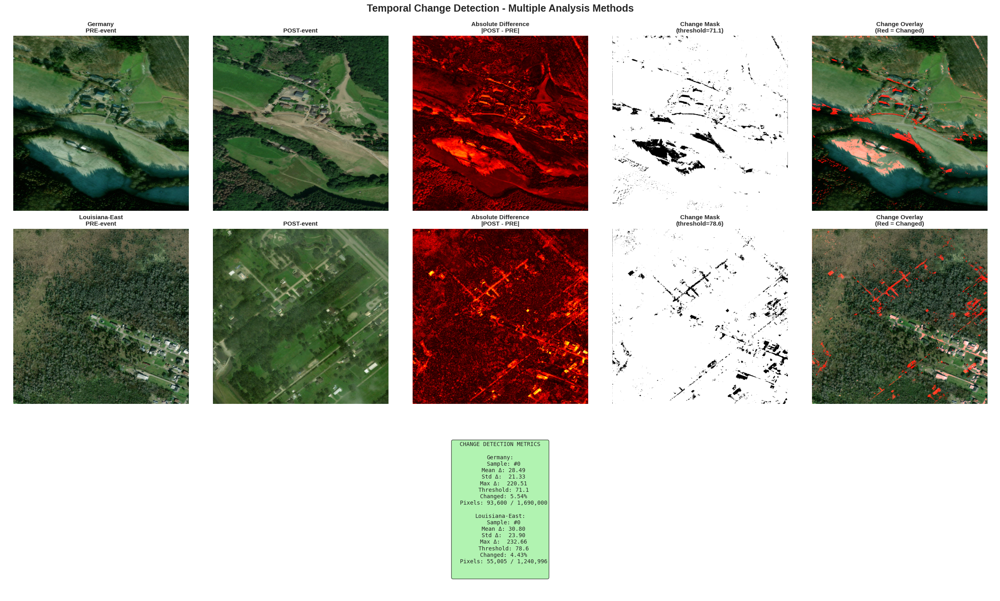


Change metrics summary:
  Germany: 5.54% changed pixels, mean Δ=28.49
  Louisiana-East: 4.43% changed pixels, mean Δ=30.80


In [341]:
print("Computing temporal change detection...")

dataset_list = [
    ("Germany", germany_path),
    ("Louisiana-East", louisiana_east_path)
]

# Visualize temporal change detection
fig, change_metrics = plot_temporal_change_detection(dataset_list)
plt.show()

print("\nChange metrics summary:")
for name, metrics in change_metrics.items():
    print(f"  {name}: {metrics['change_percentage']:.2f}% changed pixels, "
          f"mean Δ={metrics['mean_abs_diff']:.2f}")

## 8. Edge Detection & Boundary Analysis

Performing edge detection analysis...


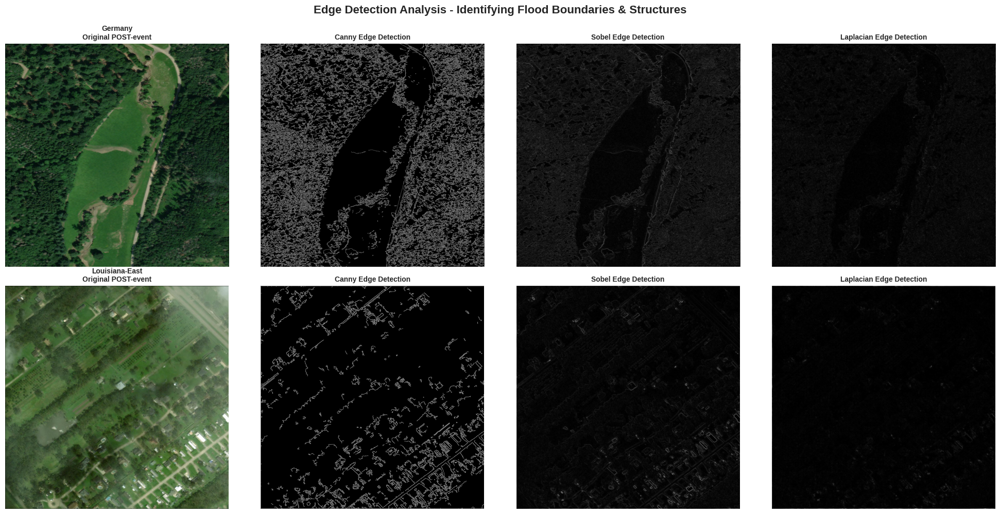

Edge detection analysis complete


In [342]:
print("Performing edge detection analysis...")

dataset_list = [
    ("Germany", germany_path),
    ("Louisiana-East", louisiana_east_path)
]

# Visualize edge detection analysis
fig = plot_edge_detection_analysis(dataset_list)
plt.show()

print("Edge detection analysis complete")

## 9. Geospatial Analysis - Interactive Flood Mapping

Extracting geospatial coordinates from annotations...
  Germany: 4,095 coordinate points extracted
  Louisiana-East: 5,944 coordinate points extracted


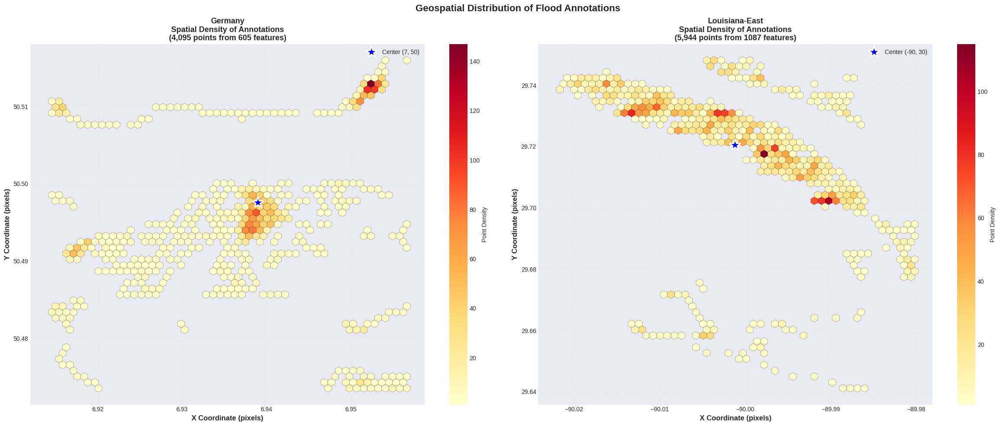


Geospatial analysis complete for 2 datasets


In [343]:
print("Extracting geospatial coordinates from annotations...")

# Extract geospatial coordinates using utility function
geospatial_data = {}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    coords_data = extract_geospatial_coordinates(dataset_path, max_files=50)
    if coords_data:
        geospatial_data[dataset_name] = coords_data
        print(f"  {dataset_name}: {len(coords_data['coordinates']):,} coordinate points extracted")

# Visualize geospatial distribution
if geospatial_data:
    fig = plot_geospatial_distribution(geospatial_data)
    plt.show()
    print(f"\nGeospatial analysis complete for {len(geospatial_data)} datasets")
else:
    print("\nNo geospatial data found")

## 10. 3D Visualization - Intensity & Change Surfaces

3D SURFACE VISUALIZATION - INTENSITY & CHANGE PATTERNS

Germany:
  3D surfaces created from (130, 130) downsampled grid
  Mean intensity - PRE: 55.46, POST: 58.17
  Change magnitude - Mean: 27.52, Max: 134.33

Germany:
  3D surfaces created from (130, 130) downsampled grid
  Mean intensity - PRE: 55.46, POST: 58.17
  Change magnitude - Mean: 27.52, Max: 134.33

Louisiana-East:
  3D surfaces created from (130, 130) downsampled grid
  Mean intensity - PRE: 54.80, POST: 70.44
  Change magnitude - Mean: 47.47, Max: 240.33

Louisiana-East:
  3D surfaces created from (130, 130) downsampled grid
  Mean intensity - PRE: 54.80, POST: 70.44
  Change magnitude - Mean: 47.47, Max: 240.33


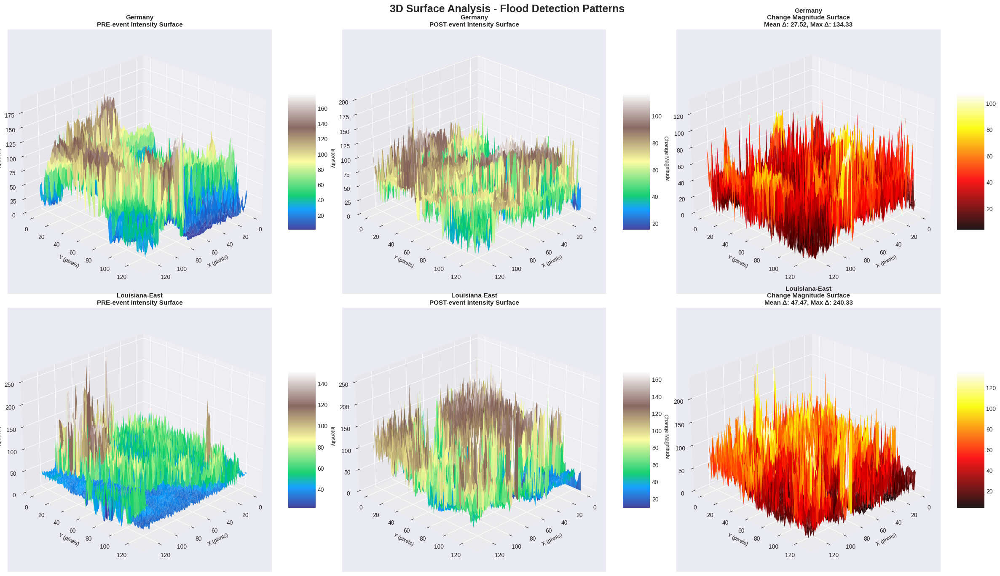


3D surface visualization complete


In [344]:
# 3D surface plots for pixel intensity and change magnitude analysis
print("=" * 80)
print("3D SURFACE VISUALIZATION - INTENSITY & CHANGE PATTERNS")
print("=" * 80)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(24, 14))
fig.suptitle('3D Surface Analysis - Flood Detection Patterns', fontsize=18, fontweight='bold')

plot_idx = 1

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    if dataset_path.exists():
        pre_dir = dataset_path / "PRE-event"
        post_dir = dataset_path / "POST-event"
        
        pre_files = sorted(list(pre_dir.glob("*.png")) + list(pre_dir.glob("*.tif")))
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(pre_files) > 0 and len(post_files) > 0:
            # Load sample images
            sample_idx = min(2, len(pre_files) - 1)
            
            pre_img = np.array(Image.open(pre_files[sample_idx])).astype(float)
            post_img = np.array(Image.open(post_files[sample_idx])).astype(float)
            
            # Handle shape mismatch
            if pre_img.shape != post_img.shape:
                post_img_pil = Image.fromarray(post_img.astype(np.uint8) if post_img.max() <= 255 
                                               else (post_img / post_img.max() * 255).astype(np.uint8))
                post_img_pil = post_img_pil.resize((pre_img.shape[1], pre_img.shape[0]), Image.Resampling.LANCZOS)
                post_img = np.array(post_img_pil).astype(float)
            
            # Normalize
            if pre_img.max() > 255:
                pre_img = pre_img / pre_img.max() * 255
            if post_img.max() > 255:
                post_img = post_img / post_img.max() * 255
            
            # Convert to grayscale for 3D visualization
            if len(pre_img.shape) == 3:
                pre_gray = np.mean(pre_img, axis=2)
                post_gray = np.mean(post_img, axis=2)
            else:
                pre_gray = pre_img
                post_gray = post_img
            
            # Downsample for visualization performance (every 10th pixel)
            downsample_factor = 10
            pre_down = pre_gray[::downsample_factor, ::downsample_factor]
            post_down = post_gray[::downsample_factor, ::downsample_factor]
            
            # Calculate change magnitude
            change_mag = np.abs(post_down - pre_down)
            
            # Create meshgrid
            x = np.arange(0, pre_down.shape[1])
            y = np.arange(0, pre_down.shape[0])
            X, Y = np.meshgrid(x, y)
            
            # Plot 1: PRE-event 3D surface
            ax1 = fig.add_subplot(2, 3, plot_idx, projection='3d')
            surf1 = ax1.plot_surface(X, Y, pre_down, cmap='terrain', 
                                     linewidth=0, antialiased=True, alpha=0.9)
            ax1.set_title(f'{dataset_name}\nPRE-event Intensity Surface', 
                         fontweight='bold', fontsize=11)
            ax1.set_xlabel('X (pixels)', fontsize=9)
            ax1.set_ylabel('Y (pixels)', fontsize=9)
            ax1.set_zlabel('Intensity', fontsize=9)
            ax1.view_init(elev=25, azim=45)
            fig.colorbar(surf1, ax=ax1, shrink=0.5, aspect=5)
            
            # Plot 2: POST-event 3D surface
            ax2 = fig.add_subplot(2, 3, plot_idx + 1, projection='3d')
            surf2 = ax2.plot_surface(X, Y, post_down, cmap='terrain', 
                                     linewidth=0, antialiased=True, alpha=0.9)
            ax2.set_title(f'{dataset_name}\nPOST-event Intensity Surface', 
                         fontweight='bold', fontsize=11)
            ax2.set_xlabel('X (pixels)', fontsize=9)
            ax2.set_ylabel('Y (pixels)', fontsize=9)
            ax2.set_zlabel('Intensity', fontsize=9)
            ax2.view_init(elev=25, azim=45)
            fig.colorbar(surf2, ax=ax2, shrink=0.5, aspect=5)
            
            # Plot 3: Change magnitude 3D surface
            ax3 = fig.add_subplot(2, 3, plot_idx + 2, projection='3d')
            surf3 = ax3.plot_surface(X, Y, change_mag, cmap='hot', 
                                     linewidth=0, antialiased=True, alpha=0.9)
            ax3.set_title(f'{dataset_name}\nChange Magnitude Surface\n'
                         f'Mean Δ: {change_mag.mean():.2f}, Max Δ: {change_mag.max():.2f}', 
                         fontweight='bold', fontsize=11)
            ax3.set_xlabel('X (pixels)', fontsize=9)
            ax3.set_ylabel('Y (pixels)', fontsize=9)
            ax3.set_zlabel('Change Magnitude', fontsize=9)
            ax3.view_init(elev=25, azim=45)
            fig.colorbar(surf3, ax=ax3, shrink=0.5, aspect=5)
            
            plot_idx += 3
            
            print(f"\n{dataset_name}:")
            print(f"  3D surfaces created from {pre_down.shape} downsampled grid")
            print(f"  Mean intensity - PRE: {pre_down.mean():.2f}, POST: {post_down.mean():.2f}")
            print(f"  Change magnitude - Mean: {change_mag.mean():.2f}, Max: {change_mag.max():.2f}")

plt.tight_layout()
plt.show()

print("\n3D surface visualization complete")
print("=" * 80)

## 11. Texture Analysis - GLCM & Frequency Domain

TEXTURE & FREQUENCY ANALYSIS - FLOOD vs NON-FLOOD PATTERNS

Germany Texture Metrics:
  GLCM Features:
    ├─ Contrast:      24.5923 (higher = more local variation)
    ├─ Dissimilarity: 3.6849
    ├─ Homogeneity:   0.2561 (higher = more uniform)
    ├─ Energy:        0.0432 (higher = more ordered)
    └─ Correlation:   0.9232
  LBP Entropy: 2.8738 (texture complexity)
  FFT Magnitude: 6.01 ± 1.10

Louisiana-East Texture Metrics:
  GLCM Features:
    ├─ Contrast:      65.3493 (higher = more local variation)
    ├─ Dissimilarity: 5.4948
    ├─ Homogeneity:   0.2018 (higher = more uniform)
    ├─ Energy:        0.0295 (higher = more ordered)
    └─ Correlation:   0.8927
  LBP Entropy: 3.1509 (texture complexity)
  FFT Magnitude: 6.26 ± 1.14

Germany Texture Metrics:
  GLCM Features:
    ├─ Contrast:      24.5923 (higher = more local variation)
    ├─ Dissimilarity: 3.6849
    ├─ Homogeneity:   0.2561 (higher = more uniform)
    ├─ Energy:        0.0432 (higher = more ordered)
    └─ Corre

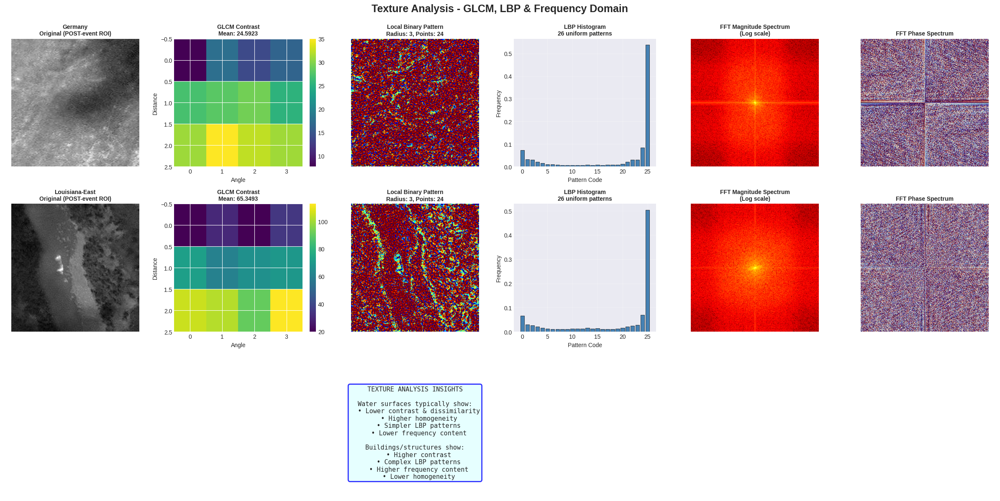


Texture analysis complete


In [345]:
# Texture analysis using GLCM features and FFT frequency analysis
print("=" * 80)
print("TEXTURE & FREQUENCY ANALYSIS - FLOOD vs NON-FLOOD PATTERNS")
print("=" * 80)

from skimage.feature import graycomatrix, graycoprops, local_binary_pattern

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('Texture Analysis - GLCM, LBP & Frequency Domain', fontsize=18, fontweight='bold', y=0.995)

texture_metrics = {}

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        post_dir = dataset_path / "POST-event"
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(post_files) > 0:
            # Load sample image
            sample_idx = min(3, len(post_files) - 1)
            img = np.array(Image.open(post_files[sample_idx]))
            
            # Convert to grayscale
            if len(img.shape) == 3:
                gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            else:
                gray = img
            
            # Normalize to 0-255
            if gray.dtype == np.uint16:
                gray = (gray / 65535.0 * 255).astype(np.uint8)
            elif gray.max() <= 1.0:
                gray = (gray * 255).astype(np.uint8)
            
            # Take a region of interest (center crop for faster computation)
            h, w = gray.shape
            roi_size = min(256, h, w)
            start_h, start_w = (h - roi_size) // 2, (w - roi_size) // 2
            roi = gray[start_h:start_h + roi_size, start_w:start_w + roi_size]
            
            # 1. Original image
            axes[row_idx, 0].imshow(roi, cmap='gray')
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal (POST-event ROI)', fontweight='bold', fontsize=10)
            axes[row_idx, 0].axis('off')
            
            # 2. GLCM Contrast
            # Compute GLCM (Gray Level Co-occurrence Matrix)
            distances = [1, 3, 5]
            angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]
            glcm = graycomatrix(roi, distances=distances, angles=angles, levels=256, 
                               symmetric=True, normed=True)
            
            # Calculate texture properties
            contrast = graycoprops(glcm, 'contrast').mean()
            dissimilarity = graycoprops(glcm, 'dissimilarity').mean()
            homogeneity = graycoprops(glcm, 'homogeneity').mean()
            energy = graycoprops(glcm, 'energy').mean()
            correlation = graycoprops(glcm, 'correlation').mean()
            
            # Visualize contrast as heatmap
            contrast_map = graycoprops(glcm, 'contrast')
            im = axes[row_idx, 1].imshow(contrast_map, cmap='viridis', aspect='auto')
            axes[row_idx, 1].set_title(f'GLCM Contrast\nMean: {contrast:.4f}', fontweight='bold', fontsize=10)
            axes[row_idx, 1].set_xlabel('Angle')
            axes[row_idx, 1].set_ylabel('Distance')
            plt.colorbar(im, ax=axes[row_idx, 1], fraction=0.046)
            
            # 3. Local Binary Pattern (LBP)
            radius = 3
            n_points = 8 * radius
            lbp = local_binary_pattern(roi, n_points, radius, method='uniform')
            
            axes[row_idx, 2].imshow(lbp, cmap='jet')
            axes[row_idx, 2].set_title(f'Local Binary Pattern\nRadius: {radius}, Points: {n_points}', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 2].axis('off')
            
            # 4. LBP Histogram
            n_bins = int(lbp.max() + 1)
            hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
            axes[row_idx, 3].bar(range(n_bins), hist, color='steelblue', edgecolor='black', linewidth=0.5)
            axes[row_idx, 3].set_title(f'LBP Histogram\n{n_bins} uniform patterns', fontweight='bold', fontsize=10)
            axes[row_idx, 3].set_xlabel('Pattern Code')
            axes[row_idx, 3].set_ylabel('Frequency')
            axes[row_idx, 3].grid(alpha=0.3)
            
            # 5. FFT (Frequency Domain)
            fft = np.fft.fft2(roi)
            fft_shift = np.fft.fftshift(fft)
            magnitude_spectrum = np.log(np.abs(fft_shift) + 1)
            
            axes[row_idx, 4].imshow(magnitude_spectrum, cmap='hot')
            axes[row_idx, 4].set_title(f'FFT Magnitude Spectrum\n(Log scale)', fontweight='bold', fontsize=10)
            axes[row_idx, 4].axis('off')
            
            # 6. FFT Phase
            phase_spectrum = np.angle(fft_shift)
            axes[row_idx, 5].imshow(phase_spectrum, cmap='twilight')
            axes[row_idx, 5].set_title(f'FFT Phase Spectrum', fontweight='bold', fontsize=10)
            axes[row_idx, 5].axis('off')
            
            # Calculate entropy manually
            lbp_entropy = -np.sum(hist * np.log2(hist + 1e-10))
            
            # Store metrics
            texture_metrics[dataset_name] = {
                'glcm_contrast': float(contrast),
                'glcm_dissimilarity': float(dissimilarity),
                'glcm_homogeneity': float(homogeneity),
                'glcm_energy': float(energy),
                'glcm_correlation': float(correlation),
                'lbp_entropy': float(lbp_entropy),
                'fft_mean_magnitude': float(magnitude_spectrum.mean()),
                'fft_std_magnitude': float(magnitude_spectrum.std())
            }
            
            print(f"\n{dataset_name} Texture Metrics:")
            print(f"  GLCM Features:")
            print(f"    ├─ Contrast:      {contrast:.4f} (higher = more local variation)")
            print(f"    ├─ Dissimilarity: {dissimilarity:.4f}")
            print(f"    ├─ Homogeneity:   {homogeneity:.4f} (higher = more uniform)")
            print(f"    ├─ Energy:        {energy:.4f} (higher = more ordered)")
            print(f"    └─ Correlation:   {correlation:.4f}")
            print(f"  LBP Entropy: {texture_metrics[dataset_name]['lbp_entropy']:.4f} (texture complexity)")
            print(f"  FFT Magnitude: {magnitude_spectrum.mean():.2f} ± {magnitude_spectrum.std():.2f}")

# Add summary in third row
for col in range(6):
    axes[2, col].axis('off')

summary_text = "TEXTURE ANALYSIS INSIGHTS\n\n"
summary_text += "Water surfaces typically show:\n"
summary_text += "  • Lower contrast & dissimilarity\n"
summary_text += "  • Higher homogeneity\n"
summary_text += "  • Simpler LBP patterns\n"
summary_text += "  • Lower frequency content\n\n"
summary_text += "Buildings/structures show:\n"
summary_text += "  • Higher contrast\n"
summary_text += "  • Complex LBP patterns\n"
summary_text += "  • Higher frequency content\n"
summary_text += "  • Lower homogeneity"

axes[2, 2].text(0.5, 0.5, summary_text, ha='center', va='center', 
               fontsize=11, family='monospace',
               bbox=dict(boxstyle='round', facecolor='lightcyan', alpha=0.8, edgecolor='blue', linewidth=2))

plt.tight_layout()
plt.show()

print("\nTexture analysis complete")
print("=" * 80)

## 12. Color Space Analysis - Water Detection Signatures

COLOR SPACE ANALYSIS - WATER SIGNATURE DETECTION

Germany Color Space Metrics:
  RGB Means: R=43.85, G=66.67, B=39.72
  HSV Means: H=58.04, S=122.17, V=66.75
  Water Index: 0.2735 ± 0.1700
  HSV Water Detection: 0.85% of pixels
  Dominant Hue: 60°

Germany Color Space Metrics:
  RGB Means: R=43.85, G=66.67, B=39.72
  HSV Means: H=58.04, S=122.17, V=66.75
  Water Index: 0.2735 ± 0.1700
  HSV Water Detection: 0.85% of pixels
  Dominant Hue: 60°

Louisiana-East Color Space Metrics:
  RGB Means: R=56.21, G=66.33, B=47.09
  HSV Means: H=47.19, S=78.16, V=66.55
  Water Index: 0.0897 ± 0.0452
  HSV Water Detection: 0.00% of pixels
  Dominant Hue: 48°

Louisiana-East Color Space Metrics:
  RGB Means: R=56.21, G=66.33, B=47.09
  HSV Means: H=47.19, S=78.16, V=66.55
  Water Index: 0.0897 ± 0.0452
  HSV Water Detection: 0.00% of pixels
  Dominant Hue: 48°


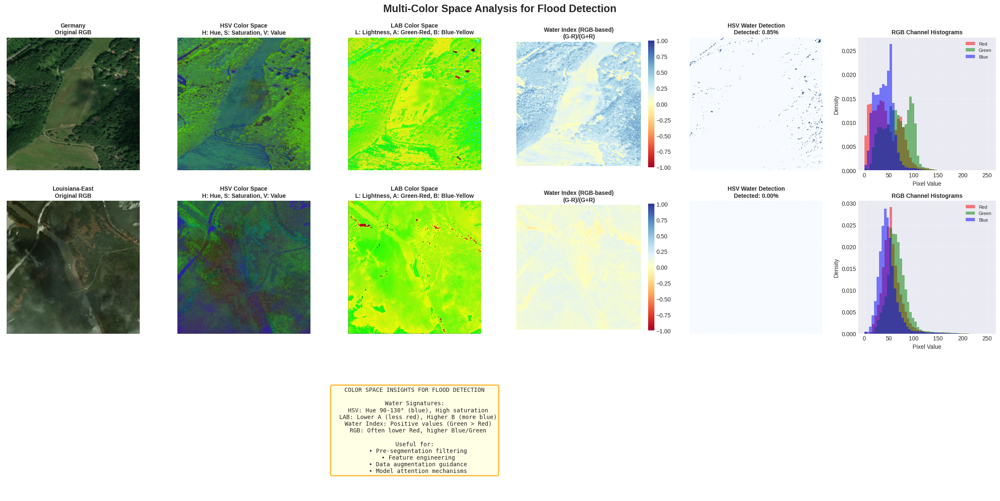


Color space analysis complete


In [346]:
# Multi-color space analysis for water detection
print("=" * 80)
print("COLOR SPACE ANALYSIS - WATER SIGNATURE DETECTION")
print("=" * 80)

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('Multi-Color Space Analysis for Flood Detection', fontsize=18, fontweight='bold', y=0.995)

color_space_metrics = {}

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        post_dir = dataset_path / "POST-event"
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(post_files) > 0:
            # Load sample image
            sample_idx = min(3, len(post_files) - 1)
            img = np.array(Image.open(post_files[sample_idx]))
            
            # Ensure RGB
            if len(img.shape) == 2:
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
            
            # Normalize to 0-255
            if img.dtype == np.uint16:
                img = (img / 65535.0 * 255).astype(np.uint8)
            elif img.max() <= 1.0:
                img = (img * 255).astype(np.uint8)
            
            # 1. Original RGB
            axes[row_idx, 0].imshow(img)
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal RGB', fontweight='bold', fontsize=10)
            axes[row_idx, 0].axis('off')
            
            # 2. HSV Color Space
            hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
            axes[row_idx, 1].imshow(hsv)
            axes[row_idx, 1].set_title(f'HSV Color Space\nH: Hue, S: Saturation, V: Value', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 1].axis('off')
            
            # 3. LAB Color Space
            lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
            # Normalize LAB for visualization
            lab_vis = lab.copy()
            lab_vis[:,:,0] = lab[:,:,0] * 255.0 / 100.0  # L channel
            lab_vis[:,:,1] = lab[:,:,1] + 128  # A channel
            lab_vis[:,:,2] = lab[:,:,2] + 128  # B channel
            axes[row_idx, 2].imshow(lab_vis.astype(np.uint8))
            axes[row_idx, 2].set_title(f'LAB Color Space\nL: Lightness, A: Green-Red, B: Blue-Yellow', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 2].axis('off')
            
            # 4. Water Index (RGB-based NDWI approximation)
            # NDWI typically uses (Green - NIR) / (Green + NIR)
            # For RGB, we approximate with (Green - Red) / (Green + Red)
            R = img[:,:,0].astype(float)
            G = img[:,:,1].astype(float)
            B = img[:,:,2].astype(float)
            
            water_index = np.zeros_like(R)
            denominator = G + R
            mask = denominator > 0
            water_index[mask] = (G[mask] - R[mask]) / (G[mask] + R[mask])
            
            im = axes[row_idx, 3].imshow(water_index, cmap='RdYlBu', vmin=-1, vmax=1)
            axes[row_idx, 3].set_title(f'Water Index (RGB-based)\n(G-R)/(G+R)', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 3].axis('off')
            plt.colorbar(im, ax=axes[row_idx, 3], fraction=0.046)
            
            # 5. HSV-based water detection (Blue-ish, high saturation)
            h_channel = hsv[:,:,0]
            s_channel = hsv[:,:,1]
            v_channel = hsv[:,:,2]
            
            # Water typically: Hue in blue range (90-130), moderate-high saturation
            water_mask_hsv = ((h_channel >= 90) & (h_channel <= 130) & (s_channel > 50)).astype(np.uint8) * 255
            
            axes[row_idx, 4].imshow(water_mask_hsv, cmap='Blues')
            water_pixels = np.sum(water_mask_hsv > 0)
            total_pixels = water_mask_hsv.size
            water_pct = 100 * water_pixels / total_pixels
            axes[row_idx, 4].set_title(f'HSV Water Detection\nDetected: {water_pct:.2f}%', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 4].axis('off')
            
            # 6. Multi-channel histogram
            axes[row_idx, 5].hist(R.ravel(), bins=50, alpha=0.5, color='red', label='Red', density=True)
            axes[row_idx, 5].hist(G.ravel(), bins=50, alpha=0.5, color='green', label='Green', density=True)
            axes[row_idx, 5].hist(B.ravel(), bins=50, alpha=0.5, color='blue', label='Blue', density=True)
            axes[row_idx, 5].set_title(f'RGB Channel Histograms', fontweight='bold', fontsize=10)
            axes[row_idx, 5].set_xlabel('Pixel Value')
            axes[row_idx, 5].set_ylabel('Density')
            axes[row_idx, 5].legend(fontsize=8)
            axes[row_idx, 5].grid(alpha=0.3)
            
            # Collect metrics
            color_space_metrics[dataset_name] = {
                'rgb_mean': [float(R.mean()), float(G.mean()), float(B.mean())],
                'rgb_std': [float(R.std()), float(G.std()), float(B.std())],
                'hsv_mean': [float(h_channel.mean()), float(s_channel.mean()), float(v_channel.mean())],
                'hsv_std': [float(h_channel.std()), float(s_channel.std()), float(v_channel.std())],
                'water_index_mean': float(water_index.mean()),
                'water_index_std': float(water_index.std()),
                'water_percentage_hsv': float(water_pct),
                'dominant_hue': int(np.median(h_channel))
            }
            
            print(f"\n{dataset_name} Color Space Metrics:")
            print(f"  RGB Means: R={R.mean():.2f}, G={G.mean():.2f}, B={B.mean():.2f}")
            print(f"  HSV Means: H={h_channel.mean():.2f}, S={s_channel.mean():.2f}, V={v_channel.mean():.2f}")
            print(f"  Water Index: {water_index.mean():.4f} ± {water_index.std():.4f}")
            print(f"  HSV Water Detection: {water_pct:.2f}% of pixels")
            print(f"  Dominant Hue: {np.median(h_channel):.0f}°")

# Add summary in third row
for col in range(6):
    axes[2, col].axis('off')

summary_text = "COLOR SPACE INSIGHTS FOR FLOOD DETECTION\n\n"
summary_text += "Water Signatures:\n"
summary_text += "  HSV: Hue 90-130° (blue), High saturation\n"
summary_text += "  LAB: Lower A (less red), Higher B (more blue)\n"
summary_text += "  Water Index: Positive values (Green > Red)\n"
summary_text += "  RGB: Often lower Red, higher Blue/Green\n\n"
summary_text += "Useful for:\n"
summary_text += "  • Pre-segmentation filtering\n"
summary_text += "  • Feature engineering\n"
summary_text += "  • Data augmentation guidance\n"
summary_text += "  • Model attention mechanisms"

axes[2, 2].text(0.5, 0.5, summary_text, ha='center', va='center', 
               fontsize=10, family='monospace',
               bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8, edgecolor='orange', linewidth=2))

plt.tight_layout()
plt.show()

print("\nColor space analysis complete")
print("=" * 80)

## 13. Segmentation Preview - Superpixels, Watershed & K-Means

SEGMENTATION PREVIEW - SUPERPIXELS, WATERSHED & CLUSTERING

Germany Segmentation Metrics:
  SLIC: 173 superpixels
  Watershed: 77 regions
  K-Means: 5 clusters, Inertia: 37116128.72
  Avg superpixel size: 1509 pixels

Germany Segmentation Metrics:
  SLIC: 173 superpixels
  Watershed: 77 regions
  K-Means: 5 clusters, Inertia: 37116128.72
  Avg superpixel size: 1509 pixels

Louisiana-East Segmentation Metrics:
  SLIC: 189 superpixels
  Watershed: 65 regions
  K-Means: 5 clusters, Inertia: 39399403.06
  Avg superpixel size: 1387 pixels

Louisiana-East Segmentation Metrics:
  SLIC: 189 superpixels
  Watershed: 65 regions
  K-Means: 5 clusters, Inertia: 39399403.06
  Avg superpixel size: 1387 pixels


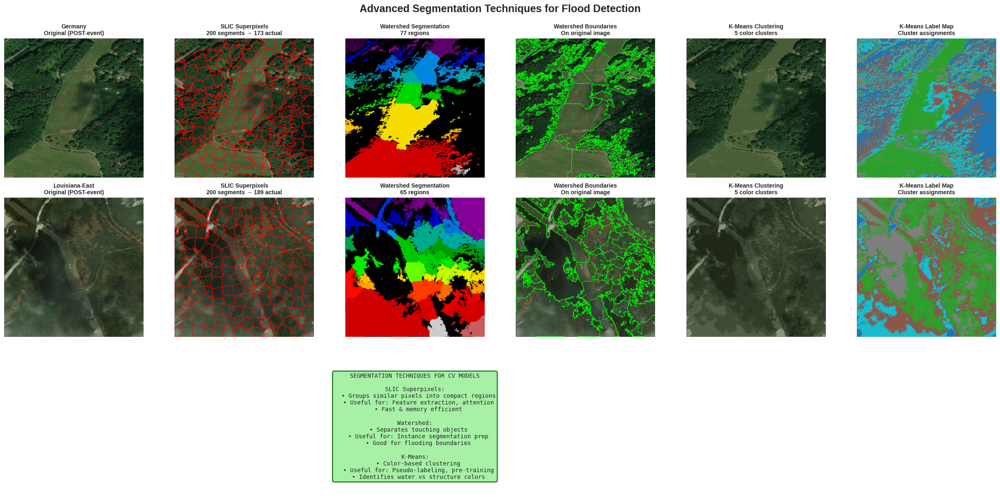

In [347]:
# Advanced segmentation techniques preview for flood detection
print("=" * 80)
print("SEGMENTATION PREVIEW - SUPERPIXELS, WATERSHED & CLUSTERING")
print("=" * 80)

from skimage.segmentation import slic, watershed, mark_boundaries
from skimage.feature import peak_local_max
from scipy import ndimage as ndi
from sklearn.cluster import KMeans

fig, axes = plt.subplots(3, 6, figsize=(24, 12))
fig.suptitle('Advanced Segmentation Techniques for Flood Detection', fontsize=18, fontweight='bold', y=0.995)

segmentation_metrics = {}

for row_idx, (dataset_name, dataset_path) in enumerate([("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]):
    if dataset_path.exists():
        post_dir = dataset_path / "POST-event"
        post_files = sorted(list(post_dir.glob("*.png")) + list(post_dir.glob("*.tif")))
        
        if len(post_files) > 0:
            # Load sample image
            sample_idx = min(3, len(post_files) - 1)
            img = np.array(Image.open(post_files[sample_idx]))
            
            # Ensure RGB
            if len(img.shape) == 2:
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
            
            # Normalize
            if img.dtype == np.uint16:
                img = (img / 65535.0 * 255).astype(np.uint8)
            elif img.max() <= 1.0:
                img = (img * 255).astype(np.uint8)
            
            # Resize for faster computation
            max_dim = 512
            h, w = img.shape[:2]
            if max(h, w) > max_dim:
                scale = max_dim / max(h, w)
                new_h, new_w = int(h * scale), int(w * scale)
                img_resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
            else:
                img_resized = img.copy()
            
            # Convert to grayscale for some operations
            gray = cv2.cvtColor(img_resized, cv2.COLOR_RGB2GRAY)
            
            # 1. Original Image
            axes[row_idx, 0].imshow(img_resized)
            axes[row_idx, 0].set_title(f'{dataset_name}\nOriginal (POST-event)', fontweight='bold', fontsize=10)
            axes[row_idx, 0].axis('off')
            
            # 2. SLIC Superpixels
            n_segments = 200
            segments_slic = slic(img_resized, n_segments=n_segments, compactness=10, 
                                sigma=1, start_label=1)
            
            img_slic = mark_boundaries(img_resized / 255.0, segments_slic, color=(1, 0, 0), mode='thick')
            axes[row_idx, 1].imshow(img_slic)
            axes[row_idx, 1].set_title(f'SLIC Superpixels\n{n_segments} segments → {len(np.unique(segments_slic))} actual', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 1].axis('off')
            
            # 3. Watershed Segmentation
            # Use gradient for markers
            gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, 
                                        cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3)))
            
            # Find peaks for markers
            distance = ndi.distance_transform_edt(gray > 50)
            coords = peak_local_max(distance, min_distance=20, labels=gray > 50)
            mask = np.zeros(distance.shape, dtype=bool)
            mask[tuple(coords.T)] = True
            markers, _ = ndi.label(mask)
            
            # Apply watershed
            labels_ws = watershed(-distance, markers, mask=gray > 50)
            
            axes[row_idx, 2].imshow(labels_ws, cmap='nipy_spectral')
            axes[row_idx, 2].set_title(f'Watershed Segmentation\n{len(np.unique(labels_ws))} regions', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 2].axis('off')
            
            # 4. Watershed with boundaries
            img_ws = mark_boundaries(img_resized / 255.0, labels_ws, color=(0, 1, 0), mode='thick')
            axes[row_idx, 3].imshow(img_ws)
            axes[row_idx, 3].set_title(f'Watershed Boundaries\nOn original image', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 3].axis('off')
            
            # 5. K-Means Clustering (Color-based)
            n_clusters = 5
            pixels = img_resized.reshape(-1, 3).astype(float)
            
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            labels_kmeans = kmeans.fit_predict(pixels)
            
            # Create segmented image
            centers = kmeans.cluster_centers_.astype(np.uint8)
            segmented_kmeans = centers[labels_kmeans].reshape(img_resized.shape)
            
            axes[row_idx, 4].imshow(segmented_kmeans)
            axes[row_idx, 4].set_title(f'K-Means Clustering\n{n_clusters} color clusters', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 4].axis('off')
            
            # 6. K-Means label map
            label_map = labels_kmeans.reshape(img_resized.shape[:2])
            axes[row_idx, 5].imshow(label_map, cmap='tab10')
            axes[row_idx, 5].set_title(f'K-Means Label Map\nCluster assignments', 
                                      fontweight='bold', fontsize=10)
            axes[row_idx, 5].axis('off')
            
            # Collect metrics
            segmentation_metrics[dataset_name] = {
                'slic_segments': int(len(np.unique(segments_slic))),
                'watershed_regions': int(len(np.unique(labels_ws))),
                'kmeans_clusters': int(n_clusters),
                'kmeans_inertia': float(kmeans.inertia_),
                'average_superpixel_size': int(img_resized.shape[0] * img_resized.shape[1] / len(np.unique(segments_slic)))
            }
            
            print(f"\n{dataset_name} Segmentation Metrics:")
            print(f"  SLIC: {len(np.unique(segments_slic))} superpixels")
            print(f"  Watershed: {len(np.unique(labels_ws))} regions")
            print(f"  K-Means: {n_clusters} clusters, Inertia: {kmeans.inertia_:.2f}")
            print(f"  Avg superpixel size: {segmentation_metrics[dataset_name]['average_superpixel_size']} pixels")

# Add summary in third row
for col in range(6):
    axes[2, col].axis('off')

summary_text = "SEGMENTATION TECHNIQUES FOR CV MODELS\n\n"
summary_text += "SLIC Superpixels:\n"
summary_text += "  • Groups similar pixels into compact regions\n"
summary_text += "  • Useful for: Feature extraction, attention\n"
summary_text += "  • Fast & memory efficient\n\n"
summary_text += "Watershed:\n"
summary_text += "  • Separates touching objects\n"
summary_text += "  • Useful for: Instance segmentation prep\n"
summary_text += "  • Good for flooding boundaries\n\n"
summary_text += "K-Means:\n"
summary_text += "  • Color-based clustering\n"
summary_text += "  • Useful for: Pseudo-labeling, pre-training\n"
summary_text += "  • Identifies water vs structure colors"

axes[2, 2].text(0.5, 0.5, summary_text, ha='center', va='center', 
               fontsize=10, family='monospace',
               bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.8, edgecolor='darkgreen', linewidth=2))

plt.tight_layout()
plt.show()

## 14. Image Quality Assessment

Analyzing potential quality issues that could impact model training:
- **Cloud Cover**: Detection of excessive clouds in satellite imagery
- **Blur Detection**: Identifying motion blur or out-of-focus images
- **Camera Angle Issues**: Detecting extreme angles or alignment problems

In [348]:
print("=" * 80)
print("IMAGE QUALITY ASSESSMENT - CLOUD COVER, BLUR & CAMERA ANGLE")
print("=" * 80)

def detect_cloud_cover(image):
    """
    Detect cloud coverage using brightness and white pixel analysis.
    Returns cloud coverage percentage (0-100).
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Normalize if needed
    if gray.dtype == np.uint16:
        gray = (gray / 65535.0 * 255).astype(np.uint8)
    
    # Method 1: Brightness threshold (clouds are very bright)
    bright_threshold = 200
    bright_mask = gray > bright_threshold
    
    # Method 2: White pixel detection in color image
    if len(image.shape) == 3:
        # Normalize image
        if image.dtype == np.uint16:
            img_norm = (image / 65535.0 * 255).astype(np.uint8)
        else:
            img_norm = image
        
        # White pixels have high values in all channels
        white_threshold = 220
        white_mask = np.all(img_norm > white_threshold, axis=-1)
    else:
        white_mask = bright_mask
    
    # Combine both methods
    cloud_mask = bright_mask | white_mask
    
    # Calculate coverage percentage
    coverage = (np.sum(cloud_mask) / cloud_mask.size) * 100
    
    return coverage, cloud_mask

def detect_blur(image):
    """
    Detect blur using Laplacian variance method.
    Returns variance score (lower = more blurred).
    """
    # Convert to grayscale
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Normalize if needed
    if gray.dtype == np.uint16:
        gray = (gray / 65535.0 * 255).astype(np.uint8)
    
    # Compute Laplacian variance
    laplacian = cv2.Laplacian(gray, cv2.CV_64F)
    variance = laplacian.var()
    
    return variance

def detect_camera_angle_issues(image):
    """
    Detect camera angle issues using edge orientation analysis.
    Returns alignment score (0-1, higher = better alignment).
    """
    # Convert to grayscale
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    
    # Normalize if needed
    if gray.dtype == np.uint16:
        gray = (gray / 65535.0 * 255).astype(np.uint8)
    
    # Compute gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    
    # Compute edge orientations
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # Only consider significant edges
    threshold = np.percentile(magnitude, 75)
    significant_edges = magnitude > threshold
    
    if np.sum(significant_edges) == 0:
        return 0.5  # Neutral score if no edges
    
    # Compute orientation angles
    angles = np.arctan2(sobely[significant_edges], sobelx[significant_edges])
    
    # Check alignment with horizontal/vertical (good for satellite imagery)
    # Angles close to 0, 90, 180, 270 degrees indicate good alignment
    angles_deg = np.abs(np.degrees(angles))
    
    # Normalize to 0-90 range
    angles_normalized = angles_deg % 90
    
    # Score based on how close to horizontal/vertical (0 or 90 degrees)
    deviations = np.minimum(angles_normalized, 90 - angles_normalized)
    alignment_score = 1 - (np.mean(deviations) / 45)  # Normalize to 0-1
    
    return alignment_score

# Analyze all datasets
quality_results = {
    'dataset': [],
    'image_type': [],
    'filename': [],
    'cloud_coverage': [],
    'blur_score': [],
    'alignment_score': [],
    'quality_issues': []
}

for dataset_name, dataset_path in [("Germany", germany_path), ("Louisiana-East", louisiana_east_path)]:
    if dataset_path.exists():
        for img_type in ['PRE-event', 'POST-event']:
            img_dir = dataset_path / img_type
            
            if img_dir.exists():
                img_files = sorted(list(img_dir.glob("*.png")) + list(img_dir.glob("*.tif")))
                
                # Sample images (analyze up to 20 per directory)
                sample_files = img_files[:min(20, len(img_files))]
                
                for img_file in sample_files:
                    try:
                        # Load image
                        img = np.array(Image.open(img_file))
                        
                        # Resize for faster processing
                        max_dim = 512
                        h, w = img.shape[:2]
                        if max(h, w) > max_dim:
                            scale = max_dim / max(h, w)
                            new_h, new_w = int(h * scale), int(w * scale)
                            img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                        
                        # Detect quality issues
                        cloud_cov, _ = detect_cloud_cover(img)
                        blur_var = detect_blur(img)
                        align_score = detect_camera_angle_issues(img)
                        
                        # Identify issues
                        issues = []
                        if cloud_cov > 30:
                            issues.append('High Cloud Cover')
                        if blur_var < 100:
                            issues.append('Blurred')
                        if align_score < 0.6:
                            issues.append('Poor Alignment')
                        
                        quality_results['dataset'].append(dataset_name)
                        quality_results['image_type'].append(img_type)
                        quality_results['filename'].append(img_file.name)
                        quality_results['cloud_coverage'].append(cloud_cov)
                        quality_results['blur_score'].append(blur_var)
                        quality_results['alignment_score'].append(align_score)
                        quality_results['quality_issues'].append(', '.join(issues) if issues else 'None')
                        
                    except Exception as e:
                        print(f"Error processing {img_file.name}: {e}")

# Create DataFrame
quality_df = pd.DataFrame(quality_results)

print("\nQuality Assessment Summary:")
print("=" * 80)
print(f"Total images analyzed: {len(quality_df)}")
print(f"\nImages with cloud coverage > 30%: {len(quality_df[quality_df['cloud_coverage'] > 30])}")
print(f"Images with blur (score < 100): {len(quality_df[quality_df['blur_score'] < 100])}")
print(f"Images with poor alignment (< 0.6): {len(quality_df[quality_df['alignment_score'] < 0.6])}")
print(f"Images with any quality issues: {len(quality_df[quality_df['quality_issues'] != 'None'])}")

print("\nMean Quality Metrics by Dataset:")
print(quality_df.groupby('dataset')[['cloud_coverage', 'blur_score', 'alignment_score']].mean())

print("\n" + "=" * 80)

IMAGE QUALITY ASSESSMENT - CLOUD COVER, BLUR & CAMERA ANGLE

Quality Assessment Summary:
Total images analyzed: 80

Images with cloud coverage > 30%: 0
Images with blur (score < 100): 2
Images with poor alignment (< 0.6): 80
Images with any quality issues: 80

Mean Quality Metrics by Dataset:
                cloud_coverage  blur_score  alignment_score
dataset                                                    
Germany               1.029307  290.894134         0.524989
Louisiana-East        1.069491  945.435237         0.496375


Quality Assessment Summary:
Total images analyzed: 80

Images with cloud coverage > 30%: 0
Images with blur (score < 100): 2
Images with poor alignment (< 0.6): 80
Images with any quality issues: 80

Mean Quality Metrics by Dataset:
                cloud_coverage  blur_score  alignment_score
dataset                                                    
Germany               1.029307  290.894134         0.524989
Louisiana-East        1.069491  945.435237         

### Visualize Quality Issues

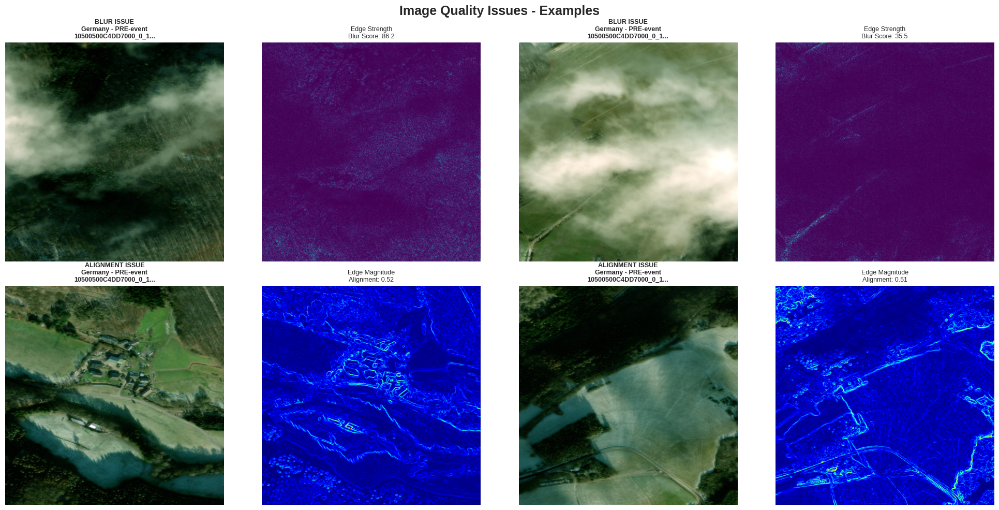

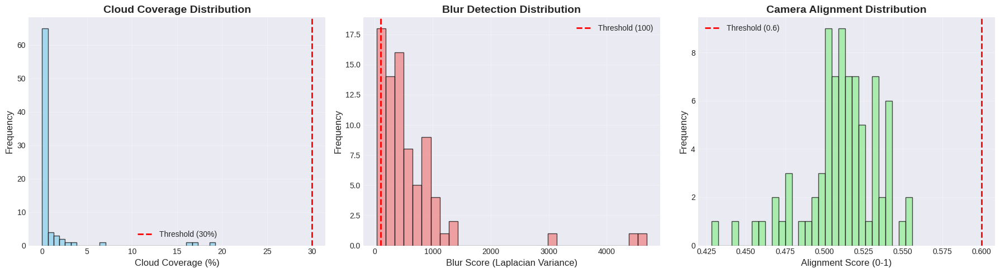

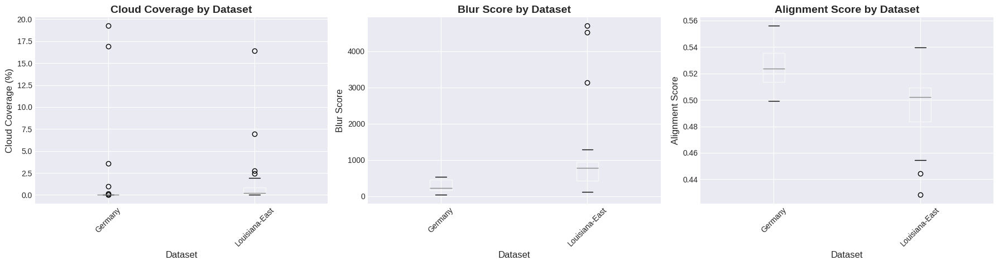

In [349]:
# Check which quality issues exist
cloud_issues = quality_df[quality_df['cloud_coverage'] > 30]
blur_issues = quality_df[quality_df['blur_score'] < 100]
alignment_issues = quality_df[quality_df['alignment_score'] < 0.6]

has_cloud_issues = len(cloud_issues) > 0
has_blur_issues = len(blur_issues) > 0
has_alignment_issues = len(alignment_issues) > 0

# Only show example visualizations if there are actual issues
if has_cloud_issues or has_blur_issues or has_alignment_issues:
    # Count how many issue types we have
    issue_rows = sum([has_cloud_issues, has_blur_issues, has_alignment_issues])
    
    fig, axes = plt.subplots(issue_rows, 4, figsize=(20, 5 * issue_rows))
    if issue_rows == 1:
        axes = axes.reshape(1, -1)
    fig.suptitle('Image Quality Issues - Examples', fontsize=18, fontweight='bold')
    
    current_row = 0
    
    # Cloud coverage examples
    if has_cloud_issues:
        examples_df = cloud_issues.head(2)
        for col_idx, (_, row) in enumerate(examples_df.iterrows()):
            if col_idx >= 2:
                break
            
            dataset_path = germany_path if row['dataset'] == 'Germany' else louisiana_east_path
            img_path = dataset_path / row['image_type'] / row['filename']
            
            if img_path.exists():
                img = np.array(Image.open(img_path))
                
                # Resize for display
                max_dim = 512
                h, w = img.shape[:2]
                if max(h, w) > max_dim:
                    scale = max_dim / max(h, w)
                    new_h, new_w = int(h * scale), int(w * scale)
                    img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                
                if img.dtype == np.uint16:
                    img = (img / 65535.0 * 255).astype(np.uint8)
                
                axes[current_row, col_idx * 2].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
                axes[current_row, col_idx * 2].set_title(
                    f"HIGH CLOUD COVER\n{row['dataset']} - {row['image_type']}\n{row['filename'][:20]}...",
                    fontsize=9, fontweight='bold'
                )
                axes[current_row, col_idx * 2].axis('off')
                
                cloud_cov, cloud_mask = detect_cloud_cover(img)
                axes[current_row, col_idx * 2 + 1].imshow(cloud_mask, cmap='hot')
                axes[current_row, col_idx * 2 + 1].set_title(
                    f"Cloud Mask\nCoverage: {cloud_cov:.1f}%",
                    fontsize=9
                )
                axes[current_row, col_idx * 2 + 1].axis('off')
        
        # Hide unused columns
        for col_idx in range(len(examples_df), 2):
            axes[current_row, col_idx * 2].axis('off')
            axes[current_row, col_idx * 2 + 1].axis('off')
        
        current_row += 1
    
    # Blur examples
    if has_blur_issues:
        examples_df = blur_issues.head(2)
        for col_idx, (_, row) in enumerate(examples_df.iterrows()):
            if col_idx >= 2:
                break
            
            dataset_path = germany_path if row['dataset'] == 'Germany' else louisiana_east_path
            img_path = dataset_path / row['image_type'] / row['filename']
            
            if img_path.exists():
                img = np.array(Image.open(img_path))
                
                max_dim = 512
                h, w = img.shape[:2]
                if max(h, w) > max_dim:
                    scale = max_dim / max(h, w)
                    new_h, new_w = int(h * scale), int(w * scale)
                    img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                
                if img.dtype == np.uint16:
                    img = (img / 65535.0 * 255).astype(np.uint8)
                
                axes[current_row, col_idx * 2].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
                axes[current_row, col_idx * 2].set_title(
                    f"BLUR ISSUE\n{row['dataset']} - {row['image_type']}\n{row['filename'][:20]}...",
                    fontsize=9, fontweight='bold'
                )
                axes[current_row, col_idx * 2].axis('off')
                
                blur_score = detect_blur(img)
                if len(img.shape) == 3:
                    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                else:
                    gray = img
                laplacian = np.abs(cv2.Laplacian(gray, cv2.CV_64F))
                axes[current_row, col_idx * 2 + 1].imshow(laplacian, cmap='viridis')
                axes[current_row, col_idx * 2 + 1].set_title(
                    f"Edge Strength\nBlur Score: {blur_score:.1f}",
                    fontsize=9
                )
                axes[current_row, col_idx * 2 + 1].axis('off')
        
        for col_idx in range(len(examples_df), 2):
            axes[current_row, col_idx * 2].axis('off')
            axes[current_row, col_idx * 2 + 1].axis('off')
        
        current_row += 1
    
    # Alignment examples
    if has_alignment_issues:
        examples_df = alignment_issues.head(2)
        for col_idx, (_, row) in enumerate(examples_df.iterrows()):
            if col_idx >= 2:
                break
            
            dataset_path = germany_path if row['dataset'] == 'Germany' else louisiana_east_path
            img_path = dataset_path / row['image_type'] / row['filename']
            
            if img_path.exists():
                img = np.array(Image.open(img_path))
                
                max_dim = 512
                h, w = img.shape[:2]
                if max(h, w) > max_dim:
                    scale = max_dim / max(h, w)
                    new_h, new_w = int(h * scale), int(w * scale)
                    img = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_AREA)
                
                if img.dtype == np.uint16:
                    img = (img / 65535.0 * 255).astype(np.uint8)
                
                axes[current_row, col_idx * 2].imshow(img, cmap='gray' if len(img.shape) == 2 else None)
                axes[current_row, col_idx * 2].set_title(
                    f"ALIGNMENT ISSUE\n{row['dataset']} - {row['image_type']}\n{row['filename'][:20]}...",
                    fontsize=9, fontweight='bold'
                )
                axes[current_row, col_idx * 2].axis('off')
                
                align_score = detect_camera_angle_issues(img)
                if len(img.shape) == 3:
                    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
                else:
                    gray = img
                sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
                sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
                magnitude = np.sqrt(sobelx**2 + sobely**2)
                axes[current_row, col_idx * 2 + 1].imshow(magnitude, cmap='jet')
                axes[current_row, col_idx * 2 + 1].set_title(
                    f"Edge Magnitude\nAlignment: {align_score:.2f}",
                    fontsize=9
                )
                axes[current_row, col_idx * 2 + 1].axis('off')
        
        for col_idx in range(len(examples_df), 2):
            axes[current_row, col_idx * 2].axis('off')
            axes[current_row, col_idx * 2 + 1].axis('off')
    
    plt.tight_layout()
    plt.show()
else:
    print("\n" + "=" * 80)
    print("NO SEVERE QUALITY ISSUES DETECTED!")
    print("=" * 80)
    print("All sampled images passed quality thresholds:")
    print(f"  - Cloud coverage < 30%")
    print(f"  - Blur score >= 100")
    print(f"  - Alignment score >= 0.6")
    print("=" * 80 + "\n")

# Distribution plots - always show these
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Cloud coverage distribution
axes[0].hist(quality_df['cloud_coverage'], bins=30, edgecolor='black', alpha=0.7, color='skyblue')
axes[0].axvline(30, color='red', linestyle='--', linewidth=2, label='Threshold (30%)')
axes[0].set_xlabel('Cloud Coverage (%)', fontsize=12)
axes[0].set_ylabel('Frequency', fontsize=12)
axes[0].set_title('Cloud Coverage Distribution', fontsize=14, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Blur score distribution
axes[1].hist(quality_df['blur_score'], bins=30, edgecolor='black', alpha=0.7, color='lightcoral')
axes[1].axvline(100, color='red', linestyle='--', linewidth=2, label='Threshold (100)')
axes[1].set_xlabel('Blur Score (Laplacian Variance)', fontsize=12)
axes[1].set_ylabel('Frequency', fontsize=12)
axes[1].set_title('Blur Detection Distribution', fontsize=14, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Alignment score distribution
axes[2].hist(quality_df['alignment_score'], bins=30, edgecolor='black', alpha=0.7, color='lightgreen')
axes[2].axvline(0.6, color='red', linestyle='--', linewidth=2, label='Threshold (0.6)')
axes[2].set_xlabel('Alignment Score (0-1)', fontsize=12)
axes[2].set_ylabel('Frequency', fontsize=12)
axes[2].set_title('Camera Alignment Distribution', fontsize=14, fontweight='bold')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Box plots by dataset - always show these
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

quality_df.boxplot(column='cloud_coverage', by='dataset', ax=axes[0])
axes[0].set_title('Cloud Coverage by Dataset', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Dataset', fontsize=12)
axes[0].set_ylabel('Cloud Coverage (%)', fontsize=12)
plt.sca(axes[0])
plt.xticks(rotation=45)

quality_df.boxplot(column='blur_score', by='dataset', ax=axes[1])
axes[1].set_title('Blur Score by Dataset', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Dataset', fontsize=12)
axes[1].set_ylabel('Blur Score', fontsize=12)
plt.sca(axes[1])
plt.xticks(rotation=45)

quality_df.boxplot(column='alignment_score', by='dataset', ax=axes[2])
axes[2].set_title('Alignment Score by Dataset', fontsize=14, fontweight='bold')
axes[2].set_xlabel('Dataset', fontsize=12)
axes[2].set_ylabel('Alignment Score', fontsize=12)
plt.sca(axes[2])
plt.xticks(rotation=45)

plt.suptitle('')
plt.tight_layout()
plt.show()
